# 🔥 Mapping AHBA gene expression values on distinct cortical surface units  🔥
* First we visualize specific parcellation schemes to map gene-expression values to structurally/functionally/cytoarchitectonically distinct units 
* We chose the Desikan-Killiany-308 region parcellation for subsequent analysis (see **Whitaker, et al., PNAS, 2016**)
* AHBA tissue wells are careuflly mapped onto parcellation units in a multi-step prpcedure: 
    * We first calcuate the centoid coordinates of each parcellation unit.
    * Then for each parcel, we find the well exhibiting the minimum euclidian distance to the parcel. 
    * For each remaining well, we find the parcel exhibiting the minimum euclidian distance to the parcel.
    * Care is taken to ensure that the MNI coordinates of a specific well fall within the correct lobe and hemisphere.
    * To correctly map each well to the correct parcellation unit in the correct hemishere/lobe, we use the detailed structure ontology embedded in the original donor AHBA dataframes
    * example ontology of well #594: 
        * Ontology1: brain 	
        * Ontology2: gray matter 	
        * Ontology3: telencephalon 	
        * Ontology4: cerebral cortex 	
        * Ontology5: frontal lobe 	
        * Ontology6: paracentral lobule, anterior part 	
        * Ontology7: paracentral lobule, anterior part, right 	paracentral lobule, anterior part, right, infe...


* **Nomenclature**:: 
    * Parcel:  An ROI within a specific parcellation schemes. This has a specific label id and a structure name, 
        * eg. label_id = 42; label_name = lh_bankssts_part1 
    * Well: A tissue sample extracted from a donor of the AHBA for microarray gene expression quantitation. Each well has a specific well_id and comprehensive metadata variables that include:
        * Specific coordinates of the extracted tissue sample in MNI standard space. 
        * Structure name and ontology as above
        
### A.S.Kanaan  😎

In [15]:
%matplotlib inline
import os 
import nibabel as nb 
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.spatial.distance import euclidean
from operator import itemgetter
pd.options.display.max_rows=200
pd.options.display.max_columns=30


parcellation_dir = '/scr/malta1/Github/ENIGMA_TOURETTE/parcellation/'
parcellation_dir = '/Users/kanaan/SCR/Github/ENIGMA_TOURETTE/parcellation'

ahba_dir         = '/scr/malta1/Github/ENIGMA_TOURETTE/AHBA/ahba_data'
ahba_dir         = '/Users/kanaan/SCR/Github/ENIGMA_TOURETTE/AHBA/ahba_data'

# Get fsaverage data


In [16]:
def return_fsaverage_data(freesurfer_dir, fsaverage_id):
    datadir = os.path.join(freesurfer_dir, fsaverage_id, 'surf')
    
    # fsaverage
    fsaverage = dict()
    fsaverage['infl_left']  = os.path.join(datadir, 'lh.inflated')
    fsaverage['infl_right'] = os.path.join(datadir, 'rh.inflated')
    fsaverage['pial_left']  = os.path.join(datadir, 'lh.pial')
    fsaverage['pial_right'] = os.path.join(datadir, 'rh.pial')
    fsaverage['sulc_left']  = os.path.join(datadir, 'lh.sulc')
    fsaverage['sulc_right'] = os.path.join(datadir, 'rh.sulc')
    
    return fsaverage

# Get parcellation annotation data
- parcellation 1: Desikan-Killany – 72 ROIs (Desikan,Neuroimage, 2006)  
    - https://surfer.nmr.mgh.harvard.edu/ftp/articles/desikan06-parcellation.pdf
- parcellation 2: Desikan-Killany sub-parcellation – 308 Cortical ROIs (Whitaker,PNAS, 2016) 
    - http://www.pnas.org/content/113/32/9105.full
- parcellation 3: Glasser Parcellation – 362 Cortical ROIs (Glasser, Nature, 2016) 
    - http://www.nature.com/nature/journal/v536/n7615/full/nature18933.html?foxtrotcallback=true

##### see here for more details 
- https://surfer.nmr.mgh.harvard.edu/fswiki/CorticalParcellation
- https://github.com/KirstieJane/NSPN_WhitakerVertes_PNAS2016/tree/master/FS_SUBJECTS/fsaverageSubP/parcellation

In [17]:
def return_fsaverage_parcellation(freesurfer_dir, fsaverage_id, parcelation):
    parc = os.path.join(parcellation_dir, fsaverage_id, 'label', parcelation)
    parc_labels, parc_ctab, parc_names = nb.freesurfer.read_annot(parc)
    return parc_labels, parc_ctab, parc_names

fsaverage = return_fsaverage_data(parcellation_dir, 'fsaverage')
fsaverage5 = return_fsaverage_data(parcellation_dir, 'fsaverage5')


DK_lh_labels, DK_lh_ctab, DK_lh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'lh.aparc.annot')
DK_rh_labels, DK_rh_ctab, DK_rh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'rh.aparc.annot')

DK500_lh_labels, DK500_lh_ctab, DK500_lh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'lh.500.aparc.annot')
DK500_rh_labels, DK500_rh_ctab, DK500_rh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'rh.500.aparc.annot')

HCP_lh_labels, HCP_lh_ctab, HCP_lh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'lh.HCP-MMP1.annot')
HCP_rh_labels, HCP_rh_ctab, HCP_rh_names = return_fsaverage_parcellation(parcellation_dir, 'fsaverage', 'rh.HCP-MMP1.annot')

In [18]:
print len(set(DK500_lh_names))
print len(set(DK500_rh_names))

154
158


# plot parcellation 

In [19]:
def plot_surf(fsaverage, surf_map_l, surf_map_r,
              threshold=None,  alpha=0.7, cmap='hot', vmin = None, vmax = None,
              bg_on_data = 1, output_file=None,
                  ):
    
    # Import libraries
    import nibabel
    import numpy as np
    import matplotlib.pyplot as plt

    from mpl_toolkits.mplot3d import Axes3D
    from nibabel import gifti

    from nilearn._utils.compat import _basestring
    from nilearn.plotting.img_plotting import _get_colorbar_and_data_ranges
    from nilearn.plotting.surf_plotting import load_surf_data, load_surf_mesh


    # load mesh and derive axes limits
    mesh_left = load_surf_mesh(fsaverage['pial_left'])
    mesh_right = load_surf_mesh(fsaverage['pial_right'])

    coords_left, faces_left = mesh_left[0], mesh_left[1]
    coords_right, faces_right = mesh_right[0], mesh_right[1]

    limits = [-65, 33]

    avg_method = 'mean'
    darkness = 1

    # if no cmap is given, set to matplotlib default
    if cmap is None:
        cmap = plt.cm.get_cmap(plt.rcParamsDefault['image.cmap'])
    else:
        # if cmap is given as string, translate to matplotlib cmap
        if isinstance(cmap, _basestring):
            cmap = plt.cm.get_cmap(cmap)

    def subplot(surf_map, bg_map, subplot_id, coords, faces, elev, azim, vmin=vmin, vmax=vmax, bg_on_data= bg_on_data):

        ax = fig.add_subplot(subplot_id, projection='3d', xlim=limits, ylim=limits)
        ax.view_init(elev=elev, azim=azim)
        ax.set_axis_off()
        p3dcollec = ax.plot_trisurf(coords[:, 0], coords[:, 1], coords[:, 2], triangles=faces, linewidth=0.,
                                    antialiased=False, color='red')

        # If depth_map and/or surf_map are provided, map these onto the surface
        # set_facecolors function of Poly3DCollection is used as passing the
        # facecolors argument to plot_trisurf does not seem to work
        if bg_map is not None or surf_map is not None:

            face_colors = np.ones((faces.shape[0], 4))
            # face_colors[:, :3] = .5*face_colors[:, :3]  # why this?

            if bg_map is not None:
                bg_data = load_surf_data(bg_map)
                if bg_data.shape[0] != coords.shape[0]:
                    raise ValueError('The bg_map does not have the same number '
                                     'of vertices as the mesh.')
                bg_faces = np.mean(bg_data[faces], axis=1)
                bg_faces = bg_faces - bg_faces.min()
                bg_faces = bg_faces / bg_faces.max()
                # control background darkness
                bg_faces *= darkness
                face_colors = plt.cm.gray_r(bg_faces)

            # modify alpha values of background
            face_colors[:, 3] = alpha * face_colors[:, 3]
            # should it be possible to modify alpha of surf data as well?

            if surf_map is not None:
                surf_map_data = surf_map  # load_surf_data(surf_map)
                if len(surf_map_data.shape) is not 1:
                    raise ValueError('surf_map can only have one dimension but has'
                                     '%i dimensions' % len(surf_map_data.shape))
                if surf_map_data.shape[0] != coords.shape[0]:
                    raise ValueError('The surf_map does not have the same number '
                                     'of vertices as the mesh.')

                # create face values from vertex values by selected avg methods
                if avg_method == 'mean':
                    surf_map_faces = np.mean(surf_map_data[faces], axis=1)
                elif avg_method == 'median':
                    surf_map_faces = np.median(surf_map_data[faces], axis=1)

                # if no vmin/vmax are passed figure them out from data
                if vmin is None:
                    vmin = np.nanmin(surf_map_faces)
                if vmax is None:
                    vmax = np.nanmax(surf_map_faces)

                # treshold if inidcated
                if threshold is None:
                    kept_indices = np.where(surf_map_faces)[0]
                else:
                    kept_indices = np.where(np.abs(surf_map_faces) >= threshold)[0]

                surf_map_faces = surf_map_faces - vmin
                surf_map_faces = surf_map_faces / (vmax - vmin)

                # multiply data with background if indicated
                if bg_on_data:
                    face_colors[kept_indices] = cmap(surf_map_faces[kept_indices]) \
                                                * face_colors[kept_indices]
                else:
                    face_colors[kept_indices] = cmap(surf_map_faces[kept_indices])

            p3dcollec.set_facecolors(face_colors)

    fig = plt.figure(figsize=(60, 20))

    subplot(surf_map_l, fsaverage['sulc_left'], 141, coords_left, faces_left, elev=0, azim=180, bg_on_data= bg_on_data)
    subplot(surf_map_l, fsaverage['sulc_left'], 142, coords_left, faces_left, elev=0, azim=0, bg_on_data= bg_on_data)
    subplot(surf_map_r, fsaverage['sulc_right'], 143, coords_right, faces_right, elev=0, azim=180, bg_on_data= bg_on_data)
    subplot(surf_map_r, fsaverage['sulc_right'], 144, coords_right, faces_right, elev=0, azim=0, bg_on_data= bg_on_data)

    plt.tight_layout()
    
    # save figure if output file is given
    if output_file is not None:
        fig.savefig(output_file)
        plt.close(fig)

# Desikan-Killany 72 ROIS (cortical and subcortical)

Number of parcels = 72


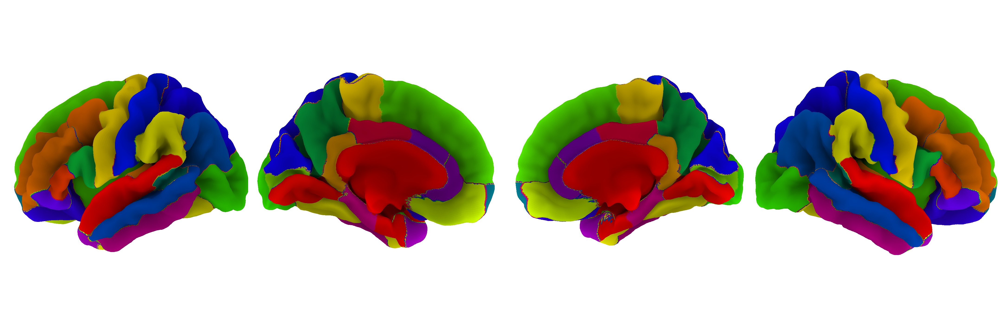

In [20]:
print 'Number of parcels =' ,len(DK_lh_names)*2
plot_surf(fsaverage, DK_lh_labels, DK_rh_labels, cmap = 'prism', alpha = 1)

# Desikan-Killany 308 cortical ROIS

Number of parcels = 308


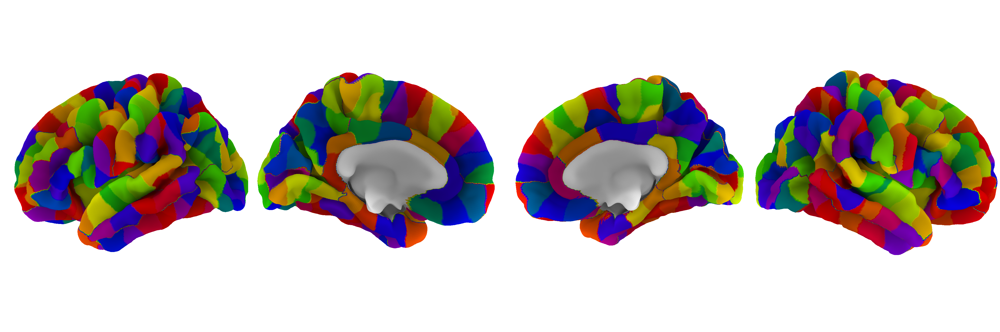

In [18]:
print 'Number of parcels =' ,len(DK500_lh_names)*2
plot_surf(fsaverage, DK500_lh_labels, DK500_rh_labels, cmap = 'prism', alpha = 1)

# Glasser 362 cortical ROIS

Number of parcels = 362


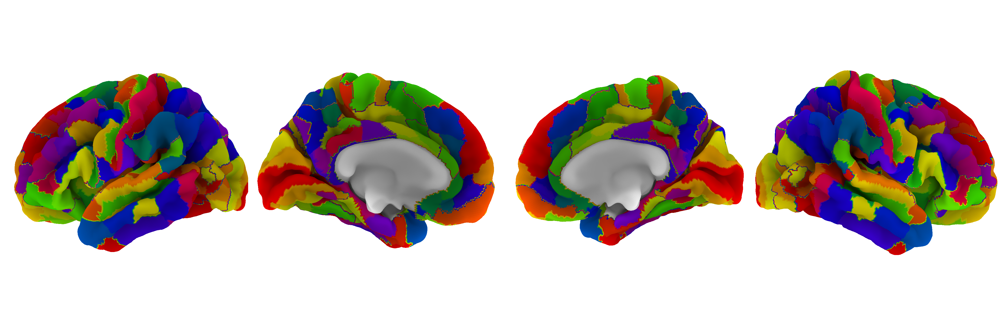

In [19]:
print 'Number of parcels =' ,len(HCP_lh_names)*2
plot_surf(fsaverage, HCP_lh_labels, HCP_rh_labels, cmap = 'prism', alpha = 1)

# For simplicity, we now only take the DK-308 parcellation (akaDK500)

# Get parcellation centroids




In [21]:
def get_parcellation_centroids(img):
    import os 
    import subprocess
    os.system('rm -rf /tmp/*')
    
    # get unique labels (ie. parcels)
    labels_data = nb.load(img).get_data().astype(int)
    background_label = 0
    unique_labels = set(np.unique(labels_data)) - set([background_label])

    # find centroids of each parcel and dump into a dataframe
    df_centroids =pd.DataFrame(index = range(1, len(unique_labels)+1), columns = ['mni_coords'])
    
    for cur_label in unique_labels:
        os.system('fslmaths %s -thr %s -uthr %s /tmp/parc_%s.nii.gz' %(img,cur_label, cur_label, cur_label))
        centriod = subprocess.check_output('fslstats /tmp/parc_%s.nii.gz -c' %cur_label, shell=True)    
        df_centroids.loc[int(cur_label)]['mni_coords'] = centriod.strip()
    
    return df_centroids

In [22]:
DK500 = os.path.join(parcellation_dir,'fsaverage/centroids/500.aparc_renum_expanded.nii.gz')
DK500_centr = get_parcellation_centroids(DK500)

In [23]:
DK500_names      = pd.read_csv(os.path.join(parcellation_dir, 'fsaverage/centroids/500.names.txt'),header= None)
DK500_centr_orig = pd.read_csv(os.path.join(parcellation_dir, 'fsaverage/centroids/500.centroids.txt'), header=None)
DK500_lobes      = pd.read_csv(os.path.join(parcellation_dir, 'fsaverage/centroids/500.lobes.txt'), header=None)
DK500_voneconomo = pd.read_csv(os.path.join(parcellation_dir, 'fsaverage/centroids/500.vonEconomoRegions.txt'), header=None)

DK500_stats = pd.concat([DK500_names, DK500_lobes,DK500_voneconomo, DK500_centr_orig,],axis = 1)
DK500_stats.index += 1 
DK500_stats = pd.concat([DK500_stats, DK500_centr], axis=1)
DK500_stats.columns = ['Names', 'Lobes', 'VonEconomo','mni_centroid_orig', 'mni_centroid_calc']

DK500_stats.head()


,Names,Lobes,VonEconomo,mni_centroid_orig,mni_centroid_calc
1,Left-Cerebral-White-Matter,.,0,-27.965157 -19.013702 17.919528,-25.871097 -17.032385 19.170759
2,Left-Lateral-Ventricle,.,0,-14.455663 -13.693461 13.713674,-14.455663 -13.693461 13.713674
3,Left-Inf-Lat-Vent,.,0,-33.906934 -22.284672 -15.821168,-33.906934 -22.284672 -15.821168
4,Left-Cerebellum-White-Matter,.,0,-17.305373 -53.431573 -36.017154,-17.305373 -53.431573 -36.017154
5,Left-Cerebellum-Cortex,.,0,-22.265823 -64.366296 -37.674831,-22.265823 -64.366296 -37.674831


# Load AHBA dataset 
* Matrix is wells(3702) x genes(20737) with an additonal 28 columns of metadata 

In [24]:
AHBA = pd.read_csv(os.path.join(ahba_dir, 'AHBA_20737.csv'),index_col=0)
META = AHBA.iloc[:,-28:]

# Drop wells outstide of the cerebral cortex
* Accomplished based on the ontology metadata 

In [28]:
ontology3        = set([AHBA.loc[well]['Ontology_3'] for well in AHBA.index])
CORTEX_wells     = [well for well in AHBA.index if AHBA.loc[well]['Ontology_3'] == 'cerebral cortex' ]
NON_CORTEX_wells = [well for well in AHBA.index if well not in CORTEX_wells]
print sorted(ontology3)
print ''
print 'Number of tissue samples (ie wells) within  the cerbral cortex =', len(CORTEX_wells)
print 'Number of tissue samples (ie wells)outside the cerbral cortex =', len(NON_CORTEX_wells)
print 'Sum should equal 3702 total wells. Check value here >>>> ', len(CORTEX_wells) + len(NON_CORTEX_wells)

['arcuate nucleus of medulla', 'central glial substance', 'cerebellum', 'cerebral cortex', 'cerebral nuclei', 'cochlear nuclei', 'cuneate nucleus', 'dorsal motor nucleus of the vagus', 'epithalamus', 'gracile nucleus', 'hypoglossal nucleus', 'hypothalamus', 'inferior olivary complex', 'lateral ventricle', 'medullary reticular formation', 'midbrain tectum', 'midbrain tegmentum', 'pons', 'pretectal region', 'raphe nuclei of medulla', 'spinal trigeminal nucleus', 'subthalamus', 'telencephalic commissures', 'telencephalic white matter tracts', 'thalamus', 'vestibular nuclei']

Number of tissue samples (ie wells) within  the cerbral cortex = 1950
Number of tissue samples (ie wells)outside the cerbral cortex = 1752
Sum should equal 3702 total wells. Check value here >>>>  3702


In [30]:
AHBA_CORTEX = AHBA.drop(NON_CORTEX_wells, axis =0)

In [31]:
# rename lobe and hemi names (done for simplicity.. making the AHBA dataframe similar to the DK500_stats dataframe)

ontology4 = set([AHBA_CORTEX.loc[well]['Ontology_4'] for well in AHBA_CORTEX.index])
print ontology4
ontology4 = ['frontal lobe','insula','limbic lobe','occipital lobe','parietal lobe','temporal lobe']

for well in AHBA_CORTEX.index:
    # get well metdata
    ontology     = AHBA_CORTEX.loc[well]['Ontology_4'].replace(' lobe','')
    hemi         = AHBA_CORTEX.loc[well]['hemisphere'].lower() + 'h'
    
    # AHBA contains Insula and limbic system as lobes...
    ### DK500 considers Insula within frontal lobe
    ### DK500 considers limbiclobe within temporal lobe
    # Therfore, rename insular and limbic lobes
    if ontology == 'insula':
        ontology = 'frontal'
    elif ontology == 'limbic':
        ontology = 'temporal'

    AHBA_CORTEX.loc[well,'Ontology_4'] = ontology
    AHBA_CORTEX.loc[well,'hemisphere'] = hemi

set(['parietal lobe', 'occipital lobe', 'limbic lobe', 'frontal lobe', 'insula', 'temporal lobe'])


# Calculate minimum euclidian distance for each well to all parcellation units
* In other words, locate AHBA well location within the DK500 parcellation 
* This is accomplished to map gene expression values from each well to the parcellation units 
* Note that some units of he DK500 parcellation do not contain any wells. 


* Example:
    * ***Romme, BiolPSych, 2017***: "Cortical samples were volumetrically mapped to the Desikan–Killiany cortical parcellation atlas (DK; 57 regions per hemisphere) (Figure 1) (33), computing the minimal Euclidean distance of the reported Montreal Neurological Institute three-dimensional coordinates of each donor sample to the Montreal Neurological Institute coordinates of all voxels of FreeSurfer’s software’sfsaverage subject."
    * ** Whitaker,PNAS, 2017 **: We used the Maybrain package (https://github.com/rittman/maybrain) to match the centroids of the MRI regions to the closest Allen Brain Institute for Brain Science (AIBS) sample in any of the 6 donors. We then determined the anatomical structure that this sample was located in. Expression data were averaged across all samples from all donors in the matching anatomical

# Modification on Romme2017 and Whitaker2016 methods----


* Since some wells do not map onto some parcels in the DK500 parcellation. A different strategy is used. 
    * Step 1. For each parcel, the closest tissue sample is mapped to this parcel. This is done for samples in the correct lobe and hemisphere
    * Step 2. For each well, the closest parcel is mapped to a well. This is done for parcels in the correct lobe and hemi.
    
* This should lead to at least one well to each parcel


In [32]:
AHBA_CORTEX_MAPPED= AHBA_CORTEX

# Mapping all parcels to closest well

In [37]:
parcel2file_csv  = '/Users/kanaan/Desktop/AHBA_CORTEX_MAPPED_parcel2well.csv'

In [38]:
# For each parcel find the closest well (ensuring the well is in the same hemi and lobe)
##### All assignments must be manually checked

if not os.path.isfile(parcel2file_csv):
    print 'Mapping Parcels to Wells'
    AHBA_CORTEX_MAPPED['DK500_name'] = 'X'
    for parcel_id in DK500_stats.index[41:]:
        # get parcel metadata
        parcel_name = DK500_stats.loc[parcel_id]['Names']
        parcel_hemi = DK500_stats.loc[parcel_id]['Names'][0:2]
        parcel_lobe = DK500_stats.loc[parcel_id]['Lobes']

        #get parcel centroid
        parcel_centroid = [float(d) for d in DK500_stats.loc[parcel_id]['mni_centroid_calc'].split()] 


        # Create new AHBA dataframe containg wells with the same lobe and hemisphere as the parcel
        drop_well_lobes = [well for well in AHBA_CORTEX_MAPPED.index if AHBA_CORTEX_MAPPED.loc[well]['Ontology_4'] != parcel_lobe]
        drop_well_hemi  = [well for well in AHBA_CORTEX_MAPPED.index if AHBA_CORTEX_MAPPED.loc[well]['hemisphere'] != parcel_hemi]
        AHBA_CORTEX_lobe_hemi = AHBA_CORTEX_MAPPED.drop(drop_well_lobes+ drop_well_hemi, axis = 0)

        # for each parcel, calculate euclidian distance to all cortical AHBA wells and place in a dictionary
        euclidian_distance_parcel_well = {}

        for well in AHBA_CORTEX_lobe_hemi.index:
            if AHBA_CORTEX_MAPPED.loc[well]['DK500_name'] == 'X':
                well_coords = tuple([AHBA_CORTEX_lobe_hemi.loc[well]['mni_x'], 
                                     AHBA_CORTEX_lobe_hemi.loc[well]['mni_y'], 
                                     AHBA_CORTEX_lobe_hemi.loc[well]['mni_z']])
                dist = euclidean(parcel_centroid, well_coords)
                euclidian_distance_parcel_well[well] = dist
            else:
                print 'well %s for for parcellation %s already assigned..not using this one' %(well, parcel_id)

        min_euclidian_distance_parcel_well = min(euclidian_distance_parcel_well, key=euclidian_distance_parcel_well.get)

        AHBA_CORTEX_MAPPED.loc[min_euclidian_distance_parcel_well,'DK500_id']         = parcel_id
        AHBA_CORTEX_MAPPED.loc[min_euclidian_distance_parcel_well,'DK500_name']       = parcel_name
        AHBA_CORTEX_MAPPED.loc[min_euclidian_distance_parcel_well,'DK500_VonEconomo'] = DK500_stats.loc[parcel_id]['VonEconomo']
        AHBA_CORTEX_MAPPED.loc[min_euclidian_distance_parcel_well,'DK500_centroid']   = DK500_stats.loc[parcel_id]['mni_centroid_calc']
        AHBA_CORTEX_MAPPED.loc[min_euclidian_distance_parcel_well,'DK500_euclidian']  = euclidian_distance_parcel_well[min_euclidian_distance_parcel_well]

        print parcel_id, parcel_name, parcel_hemi, parcel_lobe, parcel_centroid, 'Closest well =',min_euclidian_distance_parcel_well, 'Distance=', euclidian_distance_parcel_well[min_euclidian_distance_parcel_well], 'Structue=', 

    AHBA_CORTEX_MAPPED.to_csv(parcel2file_csv)

else:
    print 'Parcels to Wells already mapped... reading dataframe'
    print ''
    AHBA_CORTEX_MAPPED = pd.read_csv(parcel2file_csv, index_col =0)
    print 'Number of assigned parcels = ', len(set(AHBA_CORTEX_MAPPED['DK500_name'].dropna()))
    for well in AHBA_CORTEX_MAPPED.index:
        if  AHBA_CORTEX_MAPPED.loc[well]['DK500_name'] != 'X':
            print 'Parcel %s belongs to well %s' %(AHBA_CORTEX_MAPPED.loc[well]['DK500_name'], well)



Parcels to Wells already mapped... reading dataframe



/Users/kanaan/anaconda/lib/python2.7/site-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (20765,20769) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Number of assigned parcels =  309
Parcel rh_paracentral_part1 belongs to well 594
Parcel rh_postcentral_part1 belongs to well 428
Parcel lh_fusiform_part4 belongs to well 973
Parcel lh_transversetemporal_part1 belongs to well 1044
Parcel rh_transversetemporal_part1 belongs to well 1020
Parcel rh_insula_part2 belongs to well 1012
Parcel rh_superiortemporal_part2 belongs to well 1027
Parcel rh_superiortemporal_part5 belongs to well 1011
Parcel rh_middletemporal_part1 belongs to well 1043
Parcel rh_supramarginal_part4 belongs to well 1034
Parcel lh_caudalmiddlefrontal_part2 belongs to well 1010
Parcel lh_superiorfrontal_part8 belongs to well 970
Parcel rh_precentral_part9 belongs to well 993
Parcel lh_postcentral_part6 belongs to well 1050
Parcel rh_precentral_part5 belongs to well 946
Parcel rh_middletemporal_part6 belongs to well 939
Parcel rh_inferiortemporal_part5 belongs to well 884
Parcel lh_supramarginal_part6 belongs to well 722
Parcel rh_parahippocampal_part2 belongs to well 870


Parcel rh_superiorparietal_part1 belongs to well 5181
Parcel rh_precentral_part2 belongs to well 5178
Parcel lh_lateraloccipital_part9 belongs to well 5194
Parcel rh_inferiorparietal_part7 belongs to well 5201
Parcel rh_inferiorparietal_part5 belongs to well 5142
Parcel rh_cuneus_part1 belongs to well 5119
Parcel lh_insula_part1 belongs to well 5249
Parcel lh_rostralmiddlefrontal_part2 belongs to well 4602
Parcel rh_superiorparietal_part3 belongs to well 5165
Parcel rh_inferiorparietal_part4 belongs to well 5173
Parcel rh_supramarginal_part7 belongs to well 5162
Parcel rh_supramarginal_part6 belongs to well 5170
Parcel rh_lingual_part4 belongs to well 5158
Parcel rh_lingual_part6 belongs to well 5174
Parcel rh_lateraloccipital_part9 belongs to well 5182
Parcel rh_lateraloccipital_part5 belongs to well 5095
Parcel rh_precuneus_part7 belongs to well 5094
Parcel rh_fusiform_part4 belongs to well 5117
Parcel rh_cuneus_part2 belongs to well 5096
Parcel rh_lateraloccipital_part8 belongs to w

# Mapping remaining wells to closest parcel

In [40]:
# For each remaining well, find the closest parcel 
AHBA_remaining_wells = [well for well in AHBA_CORTEX_MAPPED.index  if AHBA_CORTEX_MAPPED.loc[well]['DK500_name'] == 'X']

In [44]:
for well in AHBA_remaining_wells:
    
    #get well metdata
    ontology     = AHBA_CORTEX.loc[well]['Ontology_4']
    hemi         = AHBA_CORTEX.loc[well]['hemisphere']
    ahba_coords  = tuple([AHBA_CORTEX.loc[well]['mni_x'], AHBA_CORTEX.loc[well]['mni_y'], AHBA_CORTEX.loc[well]['mni_z']])
    
    drop_well_lobes = [i for i in DK500_stats.index if  DK500_stats.loc[i]['Lobes'] != ontology]
    drop_well_hemi  = [i for i in DK500_stats.index if DK500_stats.loc[i]['Names'][0:2] != hemi]
    DK500_stats_lobe_hemi = DK500_stats.drop(drop_well_lobes + drop_well_hemi, axis = 0)
        
    # calculate euclidian distance between well mni coordinates and DK500 centroids
    euclidean_distance_well_parcel = {}
    for label_id in DK500_stats_lobe_hemi.index:
        centroid = [float(d) for d in DK500_stats_lobe_hemi.loc[label_id]['mni_centroid_calc'].split()] 
        euclidean_distance_well_parcel[label_id] = euclidean(ahba_coords, centroid)
        
    #find name of centroid with minumum euclidian distance to well coordinates
    min_euclidean_distance_well_parcel = min(euclidean_distance_well_parcel, key=euclidean_distance_well_parcel.get)
    
    #print min_euclidean_distance_well_parcel
    AHBA_CORTEX_MAPPED.loc[well,'DK500_id']        = min_euclidean_distance_well_parcel
    AHBA_CORTEX_MAPPED.loc[well,'DK500_name']      = DK500_stats_lobe_hemi.loc[min_euclidean_distance_well_parcel]['Names']
    AHBA_CORTEX_MAPPED.loc[well,'DK500_VonEconomo']= DK500_stats_lobe_hemi.loc[min_euclidean_distance_well_parcel]['VonEconomo']
    AHBA_CORTEX_MAPPED.loc[well,'DK500_centroid']  = DK500_stats_lobe_hemi.loc[min_euclidean_distance_well_parcel]['mni_centroid_calc']
    AHBA_CORTEX_MAPPED.loc[well,'DK500_euclidian'] = euclidean_distance_well_parcel[min_euclidean_distance_well_parcel]
    
    print 'Well ID=',well, 'Closest parcel =', DK500_stats_lobe_hemi.loc[min_euclidean_distance_well_parcel]['Names'], 'Distance=', euclidean_distance_well_parcel[min_euclidean_distance_well_parcel]

Well ID= 2785 Closest parcel = rh_parahippocampal_part1 Distance= 7.07307966328
Well ID= 2793 Closest parcel = rh_parahippocampal_part1 Distance= 6.46658273921
Well ID= 2858 Closest parcel = lh_parahippocampal_part2 Distance= 10.5697177862
Well ID= 2850 Closest parcel = lh_fusiform_part4 Distance= 12.8793496579
Well ID= 787 Closest parcel = lh_middletemporal_part1 Distance= 4.56555587423
Well ID= 961 Closest parcel = lh_parstriangularis_part2 Distance= 7.80178765674
Well ID= 969 Closest parcel = lh_lateraloccipital_part2 Distance= 22.9286135645
Well ID= 981 Closest parcel = lh_fusiform_part4 Distance= 7.12384599858
Well ID= 989 Closest parcel = lh_fusiform_part4 Distance= 8.78628901252
Well ID= 965 Closest parcel = rh_fusiform_part4 Distance= 7.52725353809
Well ID= 1052 Closest parcel = rh_fusiform_part4 Distance= 7.00381226381
Well ID= 1051 Closest parcel = lh_superiortemporal_part5 Distance= 7.40440275544
Well ID= 964 Closest parcel = lh_middletemporal_part5 Distance= 7.55819442825
W

Well ID= 690 Closest parcel = rh_transversetemporal_part1 Distance= 51.720210728
Well ID= 737 Closest parcel = rh_precentral_part6 Distance= 12.2799235172
Well ID= 729 Closest parcel = rh_postcentral_part7 Distance= 11.5245589208
Well ID= 721 Closest parcel = rh_postcentral_part8 Distance= 13.8259439344
Well ID= 697 Closest parcel = rh_postcentral_part8 Distance= 15.5531284659
Well ID= 413 Closest parcel = lh_postcentral_part5 Distance= 7.5498994402
Well ID= 673 Closest parcel = lh_inferiorparietal_part2 Distance= 8.73061201723
Well ID= 681 Closest parcel = lh_inferiorparietal_part6 Distance= 7.2802938299
Well ID= 674 Closest parcel = lh_superiorfrontal_part2 Distance= 12.596776216
Well ID= 698 Closest parcel = lh_transversetemporal_part1 Distance= 51.0638605845
Well ID= 699 Closest parcel = lh_supramarginal_part4 Distance= 8.02718164085
Well ID= 763 Closest parcel = rh_inferiortemporal_part4 Distance= 9.52817337331
Well ID= 682 Closest parcel = rh_paracentral_part1 Distance= 16.070918

Well ID= 778 Closest parcel = rh_superiortemporal_part4 Distance= 12.5378135898
Well ID= 828 Closest parcel = rh_fusiform_part2 Distance= 12.185800127
Well ID= 820 Closest parcel = rh_fusiform_part2 Distance= 9.33982550883
Well ID= 836 Closest parcel = rh_fusiform_part2 Distance= 9.03025741247
Well ID= 812 Closest parcel = rh_parahippocampal_part2 Distance= 9.92511649341
Well ID= 796 Closest parcel = rh_parahippocampal_part2 Distance= 12.8310000081
Well ID= 804 Closest parcel = rh_parahippocampal_part2 Distance= 9.87529721111
Well ID= 1265 Closest parcel = lh_middletemporal_part2 Distance= 7.98512167826
Well ID= 490 Closest parcel = lh_inferiortemporal_part2 Distance= 8.46247998918
Well ID= 1321 Closest parcel = lh_parahippocampal_part2 Distance= 12.4742561574
Well ID= 1313 Closest parcel = lh_parahippocampal_part2 Distance= 4.34889340872
Well ID= 1305 Closest parcel = rh_fusiform_part5 Distance= 7.68601231581
Well ID= 1297 Closest parcel = lh_superiortemporal_part3 Distance= 5.1443963

Well ID= 500 Closest parcel = rh_middletemporal_part2 Distance= 8.42381898728
Well ID= 484 Closest parcel = rh_fusiform_part2 Distance= 6.51728217399
Well ID= 492 Closest parcel = rh_inferiortemporal_part1 Distance= 5.38059884818
Well ID= 571 Closest parcel = rh_fusiform_part2 Distance= 6.01388945155
Well ID= 563 Closest parcel = rh_entorhinal_part1 Distance= 6.47288390512
Well ID= 547 Closest parcel = rh_entorhinal_part1 Distance= 3.41448603001
Well ID= 573 Closest parcel = lh_parsopercularis_part2 Distance= 10.7606106805
Well ID= 516 Closest parcel = rh_middletemporal_part2 Distance= 8.35392435508
Well ID= 579 Closest parcel = lh_supramarginal_part4 Distance= 12.1513074151
Well ID= 611 Closest parcel = rh_superiortemporal_part2 Distance= 15.7185607683
Well ID= 530 Closest parcel = rh_rostralmiddlefrontal_part3 Distance= 8.11828947539
Well ID= 554 Closest parcel = rh_superiorfrontal_part10 Distance= 8.59658847838
Well ID= 546 Closest parcel = rh_rostralmiddlefrontal_part3 Distance= 6.

Well ID= 1065 Closest parcel = lh_superiortemporal_part7 Distance= 2.81069942587
Well ID= 1169 Closest parcel = rh_middletemporal_part3 Distance= 6.23182160562
Well ID= 1219 Closest parcel = lh_superiorparietal_part1 Distance= 5.7959888533
Well ID= 5707 Closest parcel = rh_parahippocampal_part1 Distance= 16.056364991
Well ID= 5715 Closest parcel = rh_parahippocampal_part1 Distance= 17.905536918
Well ID= 5723 Closest parcel = rh_parahippocampal_part1 Distance= 18.2187655982
Well ID= 5731 Closest parcel = rh_parahippocampal_part1 Distance= 17.223682525
Well ID= 5739 Closest parcel = rh_parahippocampal_part1 Distance= 16.865094738
Well ID= 5755 Closest parcel = lh_parahippocampal_part2 Distance= 20.673526837
Well ID= 5668 Closest parcel = lh_parahippocampal_part2 Distance= 22.9845359509
Well ID= 5676 Closest parcel = lh_parahippocampal_part2 Distance= 25.8984407577
Well ID= 5684 Closest parcel = lh_parahippocampal_part2 Distance= 28.8918956401
Well ID= 5692 Closest parcel = lh_parahippoca

Well ID= 4939 Closest parcel = lh_superiortemporal_part5 Distance= 12.0875948048
Well ID= 4963 Closest parcel = lh_inferiortemporal_part5 Distance= 6.16687077198
Well ID= 4971 Closest parcel = lh_inferiortemporal_part5 Distance= 5.48600659116
Well ID= 4901 Closest parcel = lh_superiorparietal_part1 Distance= 13.9206324996
Well ID= 4852 Closest parcel = lh_supramarginal_part3 Distance= 9.78115228438
Well ID= 4979 Closest parcel = lh_superiorfrontal_part2 Distance= 11.4265645334
Well ID= 4987 Closest parcel = lh_superiorfrontal_part6 Distance= 15.3964806873
Well ID= 4900 Closest parcel = rh_paracentral_part2 Distance= 9.23521143352
Well ID= 4908 Closest parcel = rh_superiorfrontal_part1 Distance= 14.5983964361
Well ID= 4916 Closest parcel = lh_transversetemporal_part1 Distance= 53.0677709424
Well ID= 4924 Closest parcel = lh_transversetemporal_part1 Distance= 52.1086094172
Well ID= 4932 Closest parcel = rh_transversetemporal_part1 Distance= 49.9909455377
Well ID= 4940 Closest parcel = rh

Well ID= 5116 Closest parcel = lh_supramarginal_part6 Distance= 12.2789019758
Well ID= 5132 Closest parcel = lh_superiortemporal_part3 Distance= 17.3376400849
Well ID= 5104 Closest parcel = rh_cuneus_part2 Distance= 9.95223518751
Well ID= 5171 Closest parcel = lh_precentral_part3 Distance= 8.64807816377
Well ID= 5092 Closest parcel = lh_postcentral_part3 Distance= 12.3751896067
Well ID= 5136 Closest parcel = lh_lateraloccipital_part3 Distance= 7.8275904256
Well ID= 5152 Closest parcel = lh_pericalcarine_part1 Distance= 8.23215648603
Well ID= 5160 Closest parcel = lh_lateraloccipital_part7 Distance= 12.5398153441
Well ID= 5168 Closest parcel = lh_lateraloccipital_part8 Distance= 7.49225718733
Well ID= 5131 Closest parcel = rh_paracentral_part1 Distance= 16.662401654
Well ID= 5127 Closest parcel = lh_lingual_part6 Distance= 7.65221080001
Well ID= 4628 Closest parcel = rh_transversetemporal_part1 Distance= 67.5886882263
Well ID= 4561 Closest parcel = lh_superiorfrontal_part1 Distance= 5.6

Well ID= 5161 Closest parcel = rh_parahippocampal_part2 Distance= 6.21111374938
Well ID= 5138 Closest parcel = rh_postcentral_part5 Distance= 12.9960268026
Well ID= 5118 Closest parcel = lh_inferiorparietal_part4 Distance= 10.3144340193
Well ID= 7169 Closest parcel = rh_entorhinal_part1 Distance= 15.9535524837
Well ID= 7185 Closest parcel = rh_parahippocampal_part1 Distance= 5.90739569718
Well ID= 7193 Closest parcel = rh_parahippocampal_part1 Distance= 3.75777443749
Well ID= 7073 Closest parcel = rh_parahippocampal_part2 Distance= 11.9813673013
Well ID= 7081 Closest parcel = rh_parahippocampal_part2 Distance= 9.77524112274
Well ID= 7010 Closest parcel = lh_parahippocampal_part1 Distance= 12.9899528562
Well ID= 7009 Closest parcel = rh_parahippocampal_part2 Distance= 10.9199244598
Well ID= 7017 Closest parcel = rh_parahippocampal_part2 Distance= 13.1698706375
Well ID= 11281 Closest parcel = lh_bankssts_part1 Distance= 7.72256467479
Well ID= 11305 Closest parcel = lh_inferiortemporal_pa

Well ID= 11206 Closest parcel = lh_inferiortemporal_part3 Distance= 4.26725729298
Well ID= 11190 Closest parcel = lh_postcentral_part7 Distance= 17.4958513679
Well ID= 11174 Closest parcel = lh_precentral_part1 Distance= 5.62909236825
Well ID= 11300 Closest parcel = lh_transversetemporal_part1 Distance= 50.5445234026
Well ID= 11236 Closest parcel = lh_transversetemporal_part1 Distance= 48.8031398785
Well ID= 11228 Closest parcel = lh_transversetemporal_part1 Distance= 44.3116744662
Well ID= 13881 Closest parcel = lh_transversetemporal_part1 Distance= 45.0413377687
Well ID= 14073 Closest parcel = lh_middletemporal_part1 Distance= 11.2291832223
Well ID= 11292 Closest parcel = lh_middletemporal_part3 Distance= 8.78662613531
Well ID= 11284 Closest parcel = lh_middletemporal_part3 Distance= 5.77687881488
Well ID= 11308 Closest parcel = lh_precentral_part6 Distance= 16.0633428934
Well ID= 11113 Closest parcel = lh_lateraloccipital_part2 Distance= 22.3638213995
Well ID= 11105 Closest parcel =

Well ID= 139379850 Closest parcel = lh_parahippocampal_part2 Distance= 12.198136074
Well ID= 139379810 Closest parcel = lh_parahippocampal_part2 Distance= 15.3184354841
Well ID= 139379764 Closest parcel = lh_parahippocampal_part2 Distance= 11.7853538632
Well ID= 139379786 Closest parcel = lh_parahippocampal_part2 Distance= 14.6420077749
Well ID= 139379802 Closest parcel = lh_parahippocampal_part2 Distance= 13.7225492413
Well ID= 139379906 Closest parcel = lh_parahippocampal_part2 Distance= 14.7135459248
Well ID= 126435041 Closest parcel = lh_precuneus_part2 Distance= 4.02712371088
Well ID= 126435073 Closest parcel = lh_parahippocampal_part2 Distance= 49.2390684079
Well ID= 126435137 Closest parcel = lh_superiorparietal_part4 Distance= 11.268870818
Well ID= 126435105 Closest parcel = lh_superiorparietal_part3 Distance= 11.1401740009
Well ID= 126435011 Closest parcel = lh_superiorparietal_part10 Distance= 11.3371281219
Well ID= 126434979 Closest parcel = lh_superiorparietal_part9 Distanc

Well ID= 126434466 Closest parcel = lh_superiortemporal_part3 Distance= 25.0007541069
Well ID= 126434563 Closest parcel = lh_inferiortemporal_part4 Distance= 4.79877080114
Well ID= 126434356 Closest parcel = lh_middletemporal_part4 Distance= 8.73274691978
Well ID= 126434581 Closest parcel = lh_superiortemporal_part3 Distance= 13.492748049
Well ID= 126434417 Closest parcel = lh_transversetemporal_part1 Distance= 45.7562954575
Well ID= 126434352 Closest parcel = lh_precentral_part3 Distance= 12.7300231157
Well ID= 126434349 Closest parcel = lh_superiortemporal_part3 Distance= 12.3414810259
Well ID= 126434324 Closest parcel = lh_supramarginal_part4 Distance= 16.4994161198
Well ID= 126434440 Closest parcel = lh_inferiortemporal_part6 Distance= 5.49320101088
Well ID= 126434485 Closest parcel = lh_middletemporal_part4 Distance= 10.4588020712
Well ID= 126434393 Closest parcel = lh_precentral_part3 Distance= 5.18524450018
Well ID= 126434499 Closest parcel = lh_transversetemporal_part1 Distance

Well ID= 126432198 Closest parcel = lh_medialorbitofrontal_part1 Distance= 8.23919858975
Well ID= 126434342 Closest parcel = lh_transversetemporal_part1 Distance= 67.8209241164
Well ID= 126432148 Closest parcel = lh_transversetemporal_part1 Distance= 68.4315377731
Well ID= 126432100 Closest parcel = lh_superiorfrontal_part12 Distance= 16.3285820785
Well ID= 126431657 Closest parcel = lh_caudalmiddlefrontal_part3 Distance= 15.3776904258
Well ID= 126431772 Closest parcel = lh_superiortemporal_part2 Distance= 15.4120096124
Well ID= 126431805 Closest parcel = lh_transversetemporal_part1 Distance= 60.2292234717
Well ID= 126431789 Closest parcel = lh_transversetemporal_part1 Distance= 63.4517231287
Well ID= 126431737 Closest parcel = lh_parsopercularis_part1 Distance= 11.6164297711
Well ID= 126431770 Closest parcel = lh_medialorbitofrontal_part1 Distance= 16.4013197457
Well ID= 126426537 Closest parcel = lh_superiorfrontal_part11 Distance= 12.2271558776
Well ID= 126426553 Closest parcel = lh

Well ID= 139409921 Closest parcel = lh_transversetemporal_part1 Distance= 62.3540733713
Well ID= 139409855 Closest parcel = lh_superiorfrontal_part4 Distance= 6.17123314882
Well ID= 139409839 Closest parcel = lh_superiorfrontal_part8 Distance= 15.5879468601
Well ID= 139409887 Closest parcel = lh_precentral_part8 Distance= 10.3929883037
Well ID= 139409793 Closest parcel = lh_insula_part4 Distance= 9.88102751778
Well ID= 139409809 Closest parcel = lh_superiortemporal_part4 Distance= 7.88482790122
Well ID= 139409823 Closest parcel = lh_insula_part4 Distance= 7.99164643907
Well ID= 139409775 Closest parcel = lh_superiortemporal_part4 Distance= 14.0379795922
Well ID= 127687105 Closest parcel = lh_transversetemporal_part1 Distance= 56.0526128026
Well ID= 127687089 Closest parcel = lh_transversetemporal_part1 Distance= 58.5179117536
Well ID= 127686947 Closest parcel = lh_superiorfrontal_part8 Distance= 11.6471513819
Well ID= 127686995 Closest parcel = lh_precentral_part2 Distance= 13.41216403

Well ID= 148955136 Closest parcel = lh_fusiform_part4 Distance= 14.4417959067
Well ID= 148955119 Closest parcel = lh_transversetemporal_part1 Distance= 14.5559049873
Well ID= 148955278 Closest parcel = lh_parahippocampal_part1 Distance= 9.84162185854
Well ID= 148955298 Closest parcel = lh_parahippocampal_part2 Distance= 18.0675065153
Well ID= 148955168 Closest parcel = lh_parahippocampal_part2 Distance= 13.0555082506
Well ID= 148955152 Closest parcel = lh_parahippocampal_part2 Distance= 12.9856217287
Well ID= 148955294 Closest parcel = lh_fusiform_part4 Distance= 10.8894912191
Well ID= 147628198 Closest parcel = lh_parahippocampal_part1 Distance= 13.1604647641
Well ID= 147628377 Closest parcel = lh_parahippocampal_part1 Distance= 11.3458264047
Well ID= 141667105 Closest parcel = lh_cuneus_part2 Distance= 20.8394438885
Well ID= 141667217 Closest parcel = lh_lateraloccipital_part9 Distance= 13.3430490718
Well ID= 141667087 Closest parcel = lh_superiorparietal_part6 Distance= 10.364476076

Well ID= 159225834 Closest parcel = lh_lateraloccipital_part5 Distance= 5.9459225622
Well ID= 159225818 Closest parcel = lh_lateraloccipital_part5 Distance= 5.04579935349
Well ID= 159225802 Closest parcel = lh_lateraloccipital_part7 Distance= 9.03036624192
Well ID= 159225786 Closest parcel = lh_lateraloccipital_part1 Distance= 6.50529766872
Well ID= 159226103 Closest parcel = lh_superiorparietal_part6 Distance= 15.8648476306
Well ID= 159226167 Closest parcel = lh_lateraloccipital_part1 Distance= 15.5790702469
Well ID= 159226151 Closest parcel = lh_inferiorparietal_part2 Distance= 6.51858430914
Well ID= 159226135 Closest parcel = lh_inferiorparietal_part2 Distance= 8.72353434082
Well ID= 159225722 Closest parcel = lh_pericalcarine_part1 Distance= 7.69943735675
Well ID= 159226215 Closest parcel = lh_lateraloccipital_part7 Distance= 10.5439219678
Well ID= 159225770 Closest parcel = lh_lateraloccipital_part4 Distance= 9.54476644762
Well ID= 159225754 Closest parcel = lh_lateraloccipital_pa

Well ID= 158158331 Closest parcel = lh_precuneus_part7 Distance= 8.22744081206
Well ID= 158158315 Closest parcel = lh_superiorparietal_part1 Distance= 15.4396696463
Well ID= 158158351 Closest parcel = lh_lateraloccipital_part2 Distance= 14.9197032674
Well ID= 158158335 Closest parcel = lh_lingual_part1 Distance= 6.09627336368
Well ID= 158158303 Closest parcel = lh_lingual_part5 Distance= 9.06784376405
Well ID= 158158225 Closest parcel = lh_lateraloccipital_part2 Distance= 19.8503512711
Well ID= 158158347 Closest parcel = lh_superiorparietal_part7 Distance= 9.40233418483
Well ID= 158158365 Closest parcel = lh_lingual_part1 Distance= 14.5450709495
Well ID= 158402878 Closest parcel = lh_precuneus_part2 Distance= 11.4008319601
Well ID= 158158265 Closest parcel = lh_precuneus_part2 Distance= 12.1639246702
Well ID= 158158233 Closest parcel = lh_postcentral_part1 Distance= 9.9089878109
Well ID= 158158329 Closest parcel = lh_supramarginal_part3 Distance= 13.366403982
Well ID= 158158345 Closest

Well ID= 157772950 Closest parcel = lh_rostralmiddlefrontal_part5 Distance= 13.5500210962
Well ID= 157772934 Closest parcel = lh_superiorfrontal_part12 Distance= 9.73450526199
Well ID= 157772852 Closest parcel = lh_superiorfrontal_part9 Distance= 14.7394747872
Well ID= 157772980 Closest parcel = lh_temporalpole_part1 Distance= 51.995940916
Well ID= 157772932 Closest parcel = lh_medialorbitofrontal_part3 Distance= 6.34494588821
Well ID= 157773028 Closest parcel = lh_parsorbitalis_part1 Distance= 9.56970090515
Well ID= 157773012 Closest parcel = lh_parstriangularis_part1 Distance= 15.3457733736
Well ID= 160091947 Closest parcel = lh_parahippocampal_part1 Distance= 11.5611812029
Well ID= 160091899 Closest parcel = lh_parahippocampal_part1 Distance= 9.9828310016
Well ID= 159439091 Closest parcel = lh_temporalpole_part1 Distance= 18.0446817024
Well ID= 160091895 Closest parcel = lh_parahippocampal_part2 Distance= 12.4199152848
Well ID= 160091879 Closest parcel = lh_parahippocampal_part2 Dis

In [45]:
AHBA_CORTEX_MAPPED.head()

,61E3.4,A1BG,A1CF,A26C1B,A2BP1,A2LD1,A2M,A2ML1,A3GALT2P,A4GALT,A4GNT,AAAS,AACS,AADAC,AADACL1,...,Ontology,Ontology_0,Ontology_1,Ontology_2,Ontology_3,Ontology_4,Ontology_5,Ontology_6,Ontology_7,Ontology_8,DK500_name,DK500_id,DK500_VonEconomo,DK500_centroid,DK500_euclidian
594,12.257452,4.307083,1.639045,6.047821,11.502535,2.992096,7.702302,4.657058,1.675294,3.470479,1.694466,5.580722,5.942118,2.430642,8.623031,...,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,frontal,"paracentral lobule, anterior part","paracentral lobule, anterior part, right","paracentral lobule, anterior part, right, infe...",NaN,rh_paracentral_part1,257.0,1.0,14.000382 -33.222477 48.560398,9.869784
2785,13.356659,5.087975,2.391748,4.590116,13.365749,3.558010,9.939992,5.247008,3.760852,4.446860,2.307497,5.293467,3.392771,2.185038,9.783472,...,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,temporal,hippocampal formation,CA4 field,"CA4 field, right",NaN,rh_parahippocampal_part1,255.0,1.0,26.293258 -36.242080 -8.880991,7.073080
2793,14.097546,5.008133,1.631623,6.620493,13.778565,2.772909,7.269222,5.572003,2.566058,2.372902,1.861921,5.135714,4.236814,1.566088,9.449545,...,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,temporal,hippocampal formation,dentate gyrus,"dentate gyrus, right",NaN,rh_parahippocampal_part1,255.0,1.0,26.293258 -36.242080 -8.880991,6.466583
2858,12.043521,5.013767,1.947309,6.272927,11.775498,2.128210,7.709195,4.939403,2.194948,4.038434,1.888392,3.740389,5.320061,1.890004,9.157215,...,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,temporal,hippocampal formation,subiculum,"subiculum, left",NaN,lh_parahippocampal_part2,101.0,1.0,-24.550021 -36.896977 -9.590038,10.569718
2850,12.886543,5.411806,2.821428,4.249630,12.917862,2.913164,7.325278,4.731673,2.223835,3.461310,2.484408,3.380420,3.901454,2.492353,9.323511,...,brain//gray matter//telencephalon//cerebral co...,brain,gray matter,telencephalon,cerebral cortex,temporal,hippocampal formation,CA1 field,"CA1 field, left",NaN,lh_fusiform_part4,55.0,2.0,-38.468896 -36.339036 -20.529549,12.879350


# Remove outliers wells based on euclidian distance from parcel centroid

In [48]:
outlier_wells = [i for i in AHBA_CORTEX_MAPPED.index if AHBA_CORTEX_MAPPED.loc[i]['DK500_euclidian'] > 30]

In [59]:
AHBA_CORTEX_MAPPED_QC = AHBA_CORTEX_MAPPED.drop(outlier_wells, axis = 0 )
print 'Number of outlier well =', len(outlier_wells)
print 'Total wells mapped to parcels = %s of 3702' %len(AHBA_CORTEX_MAPPED_QC.index)

Number of outlier well = 143
Total wells mapped to parcels = 1807 of 3702


In [65]:
# Inspect well count per parcel

In [68]:
for i in DK500_stats.index:
    DK500_stats.loc[i, 'AHBA_sample_count' ] = list(AHBA_CORTEX_MAPPED_QC['DK500_id']).count(i)
DK500_stats['AHBA_sample_count'] = DK500_stats['AHBA_sample_count'].astype(int)

In [72]:
DK500_stats.iloc[41:,:]

,Names,Lobes,VonEconomo,mni_centroid_orig,mni_centroid_calc,AHBA_sample_count
42,lh_bankssts_part1,temporal,3,-56.403550 -40.152663 1.708876,-53.748469 -39.768367 1.347959,7
43,lh_bankssts_part2,temporal,3,-53.140506 -49.843038 8.264557,-51.271612 -49.249861 8.047407,10
44,lh_caudalanteriorcingulate_part1,frontal,1,-5.001684 20.645903 25.733446,-6.543778 19.781388 24.878855,2
45,lh_caudalmiddlefrontal_part1,frontal,2,-33.265925 20.200202 45.347826,-32.230196 18.259087 43.624884,4
46,lh_caudalmiddlefrontal_part2,frontal,2,-31.958115 2.146597 51.269110,-30.450507 1.991791 49.185901,6
47,lh_caudalmiddlefrontal_part3,frontal,2,-38.795007 12.584757 33.278581,-36.513318 10.905192 32.192325,6
48,lh_caudalmiddlefrontal_part4,frontal,2,-39.715079 11.341351 48.846438,-38.888336 10.602543 47.907131,9
49,lh_cuneus_part1,occipital,4,-8.609127 -73.360119 17.095238,-10.128155 -74.330583 17.219903,11
50,lh_cuneus_part2,occipital,4,-5.304200 -87.102157 19.323496,-6.388592 -86.469994 19.070707,5
51,lh_entorhinal_part1,temporal,2,-24.010774 -5.861410 -32.826641,-25.182685 -5.595745 -32.265957,37


# Calculate average gene expression for all wells per parcel 

In [75]:
AHBA_CORTEX_MAPPED_AV = AHBA_CORTEX_MAPPED_QC.groupby('DK500_name').mean().iloc[:,:-12]
print 'Total Number of Remaining Parcels =',len(AHBA_CORTEX_MAPPED_AV)

Total Number of Remaining Parcels = 307


# ⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽
# ⚽⚽⚽⚽ Now to win the game, lets plot genes on the surface ⚽⚽⚽⚽
# ⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽⚽



In [110]:
# Replace label_id with label_names for each vertex in the fsvarege parcellation
## Note that the labels in annot files are indexed differntly from the parcellation values in 500.names.txt
## used subsequently to map gene-expression values

# put annot file label names in df for easy index grabbing
df_DK500_lh_names = pd.DataFrame(DK500_lh_names, columns = ['label_name'])
df_DK500_rh_names = pd.DataFrame(DK500_rh_names, columns = ['label_name'])

DK500_lh_labels_named = ['lh_' + df_DK500_lh_names.loc[label]['label_name'] for label in DK500_lh_labels ]
DK500_rh_labels_named = ['rh_' + df_DK500_rh_names.loc[label]['label_name'] for label in DK500_rh_labels ]


In [ ]:
def plot_gene(df, GENE, cmap, vx = 1.5):
    
    #Replace label_name by gene-expression value for each vertex in the fsaverage parcellation 
    gene_expression_lh = []
    for i in DK500_lh_labels_named:
        if i in AHBA_CORTEX_MAPPED_AV.index:
            gene_expression_lh.append(AHBA_CORTEX_MAPPED_AV.loc[i][GENE])
        else:
            gene_expression_lh.append(0)
            
    gene_expression_rh = []
    for i in DK500_rh_labels_named:
        if i in AHBA_CORTEX_MAPPED_AV.index:
            gene_expression_rh.append(AHBA_CORTEX_MAPPED_AV.loc[i][GENE])
        else:
            gene_expression_rh.append(0)
            
    #PLOT GENE EXPRESSION VALS ON SURFACE
    vrange = [i for i in gene_expression_lh if i != 0]
    vmin = min(vrange) - vx 
    vmax = max(vrange) + vx
    print vmin, vmax
    plot_surf(fsaverage, 
              np.array(gene_expression_lh), 
              np.array(gene_expression_rh), 
              cmap = cmap, alpha = 1, vmin = vmin, vmax = vmax)
    
    fig = plt.figure(figsize=(8, 3))
    ax1 = fig.add_axes([0.05, 0.80, 0.9, 0.15])
    norm = mpl.colors.Normalize(vmin= vmin, vmax=vmax)
    cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=cmap,norm=norm,orientation='horizontal')

8.41198490124 9.11648765727


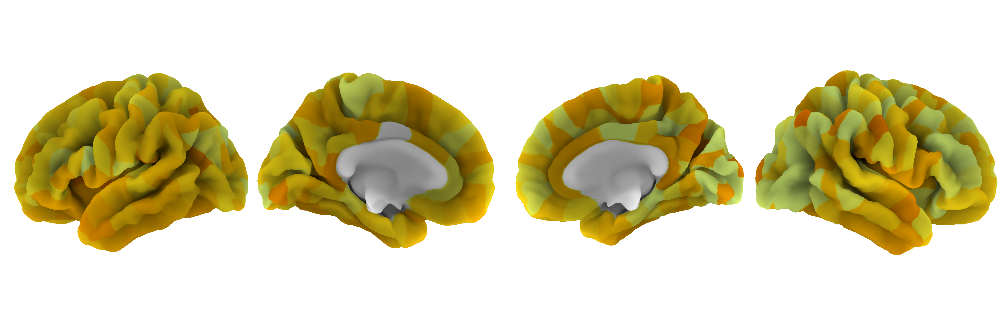

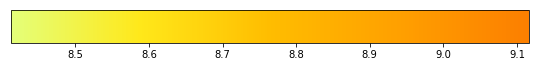

In [131]:
plot_gene(AHBA_CORTEX_MAPPED_AV, 'SLITRK1', 'Wistia')

8.41198490124 9.11648765727


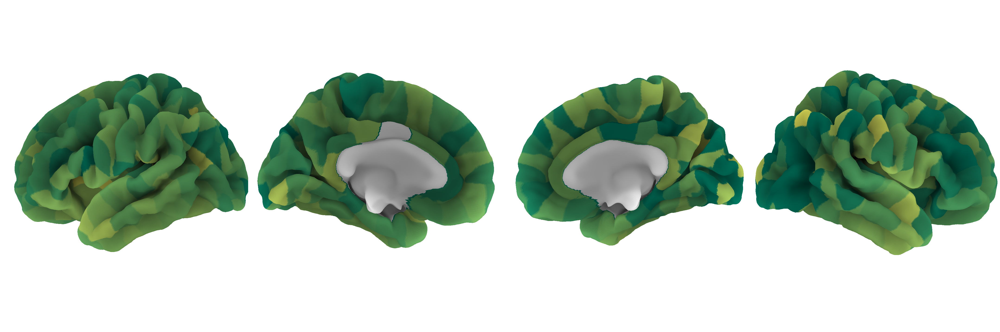

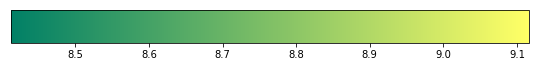

In [132]:
plot_gene(AHBA_CORTEX_MAPPED_AV, 'SLITRK1', 'summer')

8.41198490124 9.11648765727


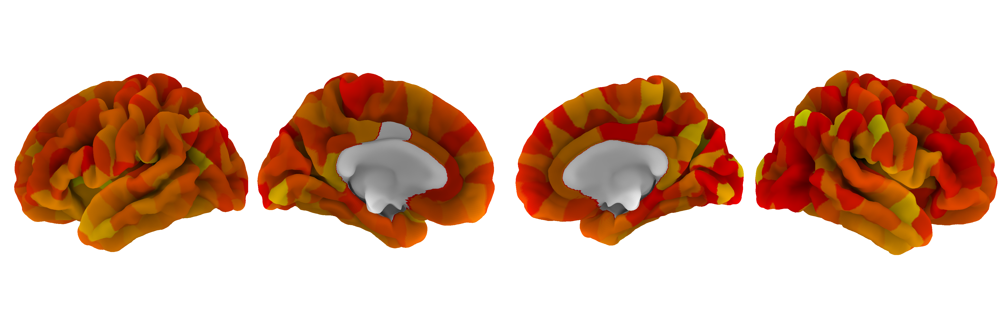

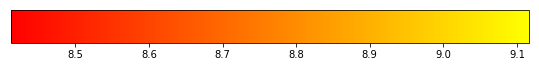

In [134]:
plot_gene(AHBA_CORTEX_MAPPED_AV, 'SLITRK1', 'autumn')

8.41198490124 9.11648765727


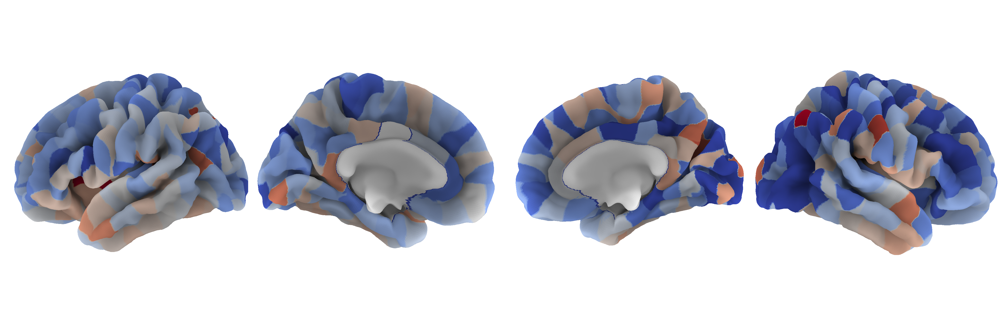

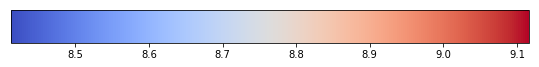

In [138]:
plot_gene(AHBA_CORTEX_MAPPED_AV, 'SLITRK1', 'coolwarm')